In [1]:
import torch
import torch.nn as nn
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import f1_score
import time
from tqdm.notebook import tqdm
from collections import defaultdict
import torch.nn.functional as F

In [2]:
import sys
from pathlib import Path

# Le notebook tourne depuis exp/ ; la racine du repo (qui contient ppg/) est juste au-dessus
REPO_ROOT = Path.cwd().parent
sys.path.insert(0, str(REPO_ROOT))

from ppg.core.PPGB import PM

### 1. Finds centroids

In [3]:
DATA_ROOT = "/Users/alex/Developpement/Internship/datasets/aqua20/data/aqua20"
NUM_CLASSES = 20
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
RESOLUTION = 252

In [4]:
transform = transforms.Compose([
    transforms.Resize(RESOLUTION),
    transforms.CenterCrop(RESOLUTION),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

In [5]:
train_dataset = datasets.ImageFolder(f"{DATA_ROOT}/train", transform=transform)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=False)

In [6]:
backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitb14')
backbone.eval()
for p in backbone.parameters():
    p.requires_grad = False
backbone = backbone.to(DEVICE)

Using cache found in /Users/alex/.cache/torch/hub/facebookresearch_dinov2_main
/Users/alex/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/Users/alex/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/Users/alex/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


In [7]:
feats, labels = [], []
with torch.no_grad():
    for x, y in tqdm(train_loader, desc="Extraction features"):
        z = backbone(x.to(DEVICE))
        feats.append(z.cpu())
        labels.append(y)

features = torch.cat(feats)
labels   = torch.cat(labels)
features = F.normalize(features, dim=1)
print(features.shape, labels.shape)

Extraction features:   0%|          | 0/103 [00:00<?, ?it/s]

torch.Size([6559, 768]) torch.Size([6559])


In [8]:
import numpy as np
import kmedoids

IPC = 1
features_np = features.numpy()
labels_np   = labels.numpy()

medoid_global_idx = {}
for c in range(NUM_CLASSES):
    cls_idx = np.where(labels_np == c)[0]
    Fc = features_np[cls_idx]
    k  = min(IPC, len(cls_idx))

    D = np.clip(1.0 - Fc @ Fc.T, 0.0, 2.0)
    np.fill_diagonal(D, 0.0)

    res = kmedoids.fasterpam(D, k) 
    medoid_global_idx[c] = cls_idx[res.medoids].tolist()

    print(f"classe {c}: {len(cls_idx)} images -> {k} médoïdes")

classe 0: 1562 images -> 1 médoïdes
classe 1: 43 images -> 1 médoïdes
classe 2: 51 images -> 1 médoïdes
classe 3: 160 images -> 1 médoïdes
classe 4: 2200 images -> 1 médoïdes
classe 5: 272 images -> 1 médoïdes
classe 6: 50 images -> 1 médoïdes
classe 7: 97 images -> 1 médoïdes
classe 8: 20 images -> 1 médoïdes
classe 9: 20 images -> 1 médoïdes
classe 10: 382 images -> 1 médoïdes
classe 11: 890 images -> 1 médoïdes
classe 12: 35 images -> 1 médoïdes
classe 13: 79 images -> 1 médoïdes
classe 14: 115 images -> 1 médoïdes
classe 15: 71 images -> 1 médoïdes
classe 16: 22 images -> 1 médoïdes
classe 17: 24 images -> 1 médoïdes
classe 18: 166 images -> 1 médoïdes
classe 19: 300 images -> 1 médoïdes


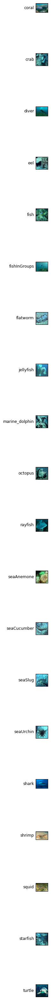

In [10]:
import matplotlib.pyplot as plt
from PIL import Image

idx_to_class = {v: k for k, v in train_dataset.class_to_idx.items()}

IPC_SHOW = IPC  # médoïdes par classe à afficher
fig, axes = plt.subplots(NUM_CLASSES, IPC_SHOW,
                         figsize=(IPC_SHOW * 1.6, NUM_CLASSES * 1.6))
axes = np.asarray(axes).reshape(NUM_CLASSES, IPC_SHOW)  # garde-fou si IPC_SHOW == 1 ou NUM_CLASSES == 1

for c in range(NUM_CLASSES):
    indices = medoid_global_idx[c]
    for j in range(IPC_SHOW):
        ax = axes[c, j]
        ax.set_xticks([]); ax.set_yticks([])
        if j < len(indices):
            img = Image.open(train_dataset.samples[indices[j]][0]).convert("RGB")
            ax.imshow(img)
        if j == 0:  # nom de classe à gauche de chaque ligne
            ax.set_ylabel(idx_to_class[c], rotation=0, ha="right",
                          va="center", fontsize=9)

plt.tight_layout()
plt.show()

### PPG


In [16]:
from ppg.core.PPGB import PM
CHECKPOINT = "../ppg/weight/I40000_E500_ppg.pth"


pm = PM(input_channels=3).to(DEVICE)
ckpt = torch.load(CHECKPOINT, map_location=DEVICE)
pm.load_state_dict(ckpt['state_dict'])
pm.eval()
print(f"Loaded checkpoint — iter {ckpt['iter']}, epoch {ckpt['epoch']}")

Loaded checkpoint — iter 40000, epoch 500


In [17]:
def load_img(path):
    """PNG -> tensor [1,3,H,W] dans [-1,1] (meme pipeline que data/util.py)."""
    pil = Image.open(path).convert('RGB').resize((256, 256), Image.BICUBIC)
    arr = np.array(pil, dtype=np.float32) / 255.0      # [0,1]
    arr = arr * 2.0 - 1.0                              # [-1,1]
    return torch.from_numpy(arr.transpose(2, 0, 1)).unsqueeze(0).float().to(DEVICE)

In [ ]:
IMG_SIZE = 256
eps = 1e-6
idx_to_class = {v: k for k, v in train_dataset.class_to_idx.items()}

def to_display(t, denorm=False):
    """Tensor [1,C,H,W] -> numpy HWC (ou HW si 1 canal) dans [0,1]."""
    t = t[0].detach().cpu().float()
    if denorm:
        t = (t + 1) / 2
    t = t.numpy()
    return t[0] if t.shape[0] == 1 else t.transpose(1, 2, 0)

def run_ppg_on_path(path):
    """Charge une image, la passe dans PPG, retourne les 4 panneaux T,B,R,G."""
    I_tensor = load_img(path)  # [-1,1]
    with torch.no_grad():
        p_a, p_t = pm(I_tensor) 
    T = torch.sigmoid(p_t)
    B = p_a
    I_disp = to_display(I_tensor, denorm=True)
    T_disp = to_display(T, denorm=False)
    B_disp = to_display(B, denorm=True)
    J_hat = (I_tensor - (1 - T) * B) / T.clamp(min=1e-2)
    J_hat = J_hat.clamp(-1, 1)
    J_hat_disp = to_display(J_hat, denorm=True)
    return {"I": I_disp, "T": T_disp, "B": B_disp, "J_hat": J_hat_disp}

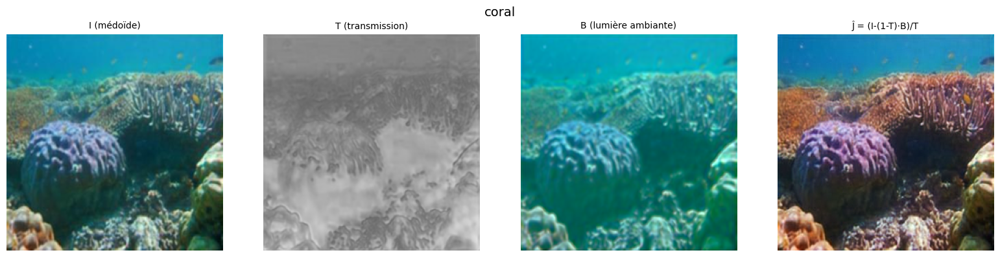

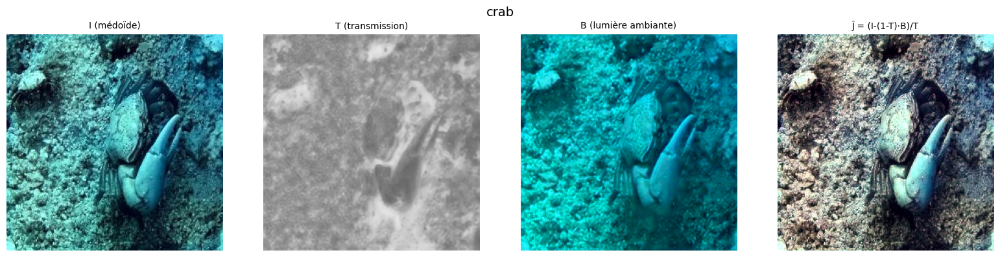

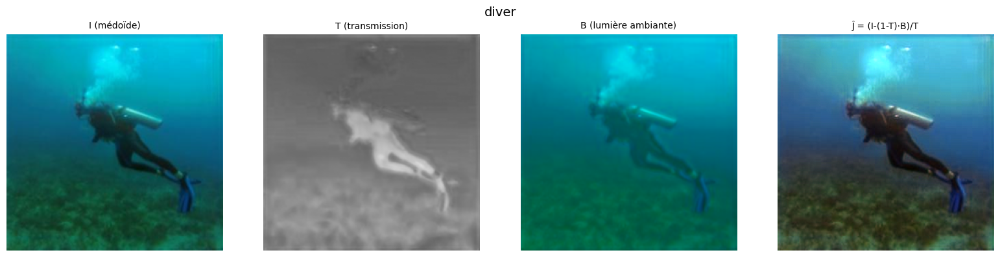

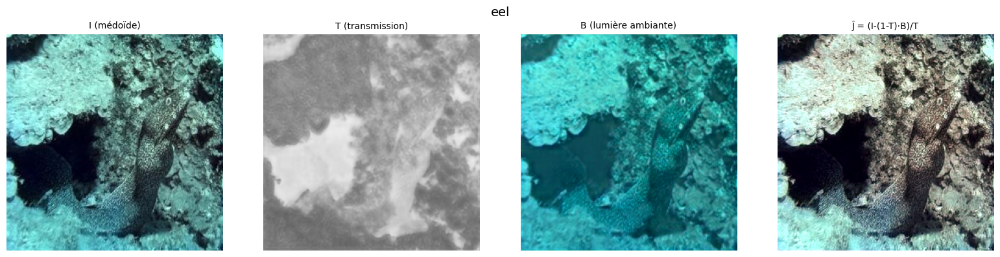

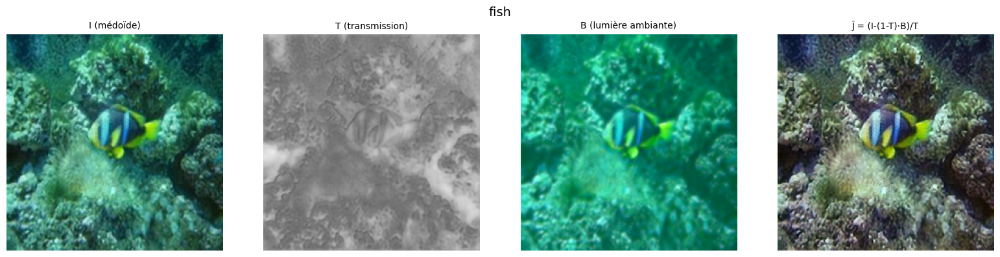

...

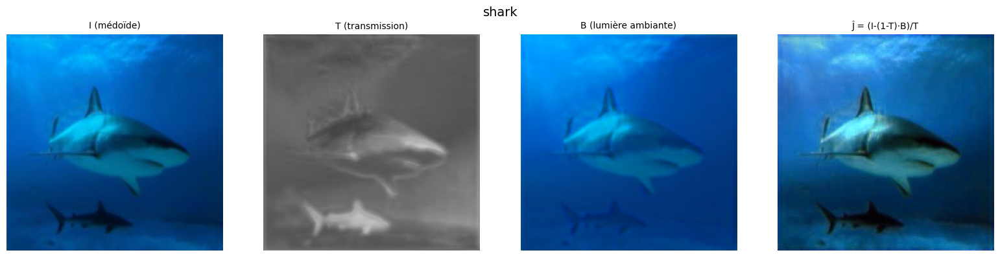

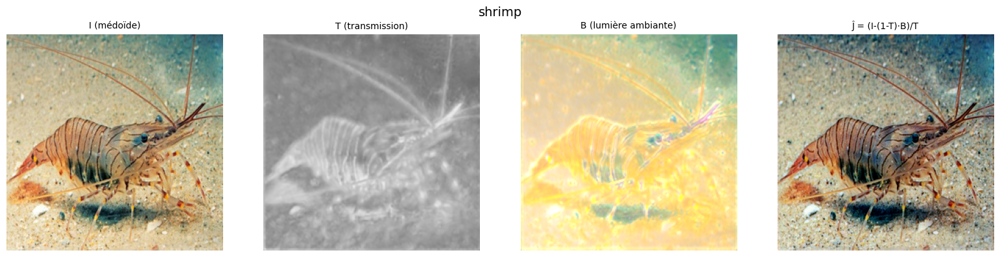

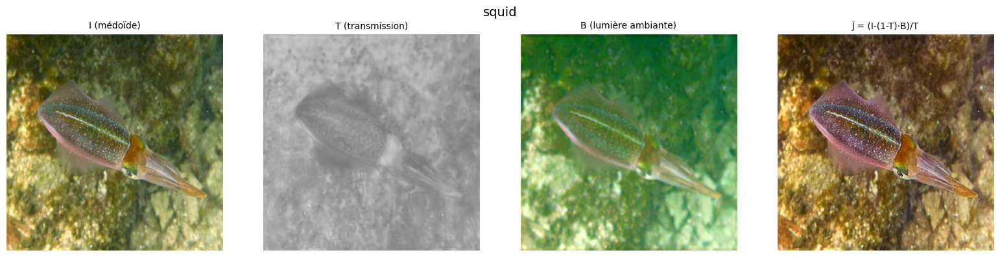

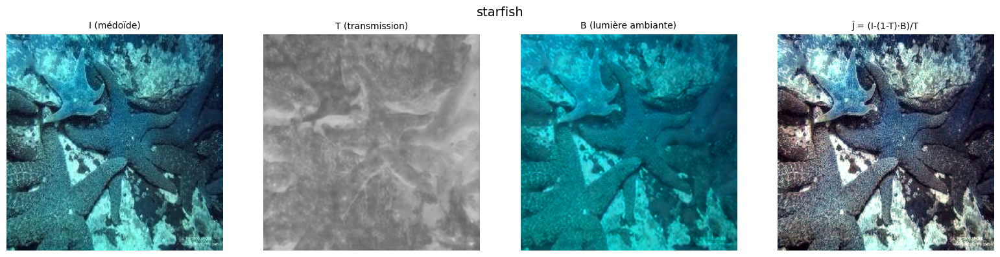

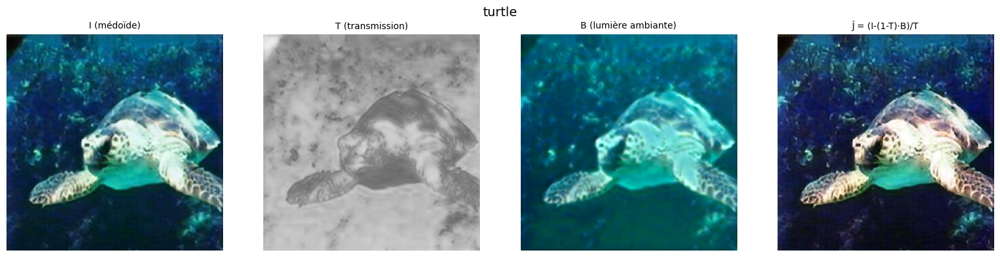

In [19]:
PANELS = ["I", "T", "B", "J_hat"]
TITLES = {"I": "I (médoïde)", "T": "T (transmission)",
          "B": "B (lumière ambiante)", "J_hat": "Ĵ = (I-(1-T)·B)/T"}

for c in range(NUM_CLASSES):
    indices = medoid_global_idx[c]
    fig, axes = plt.subplots(len(indices), 4, figsize=(16, 4 * len(indices)))
    axes = np.atleast_2d(axes)
    fig.suptitle(idx_to_class[c], fontsize=14)
    for i, gi in enumerate(indices):
        out = run_ppg_on_path(train_dataset.samples[gi][0])
        for j, key in enumerate(PANELS):
            ax = axes[i, j]
            ax.imshow(out[key], cmap="gray", vmin=0, vmax=1) if key == "T" else ax.imshow(out[key])
            ax.axis("off")
            if i == 0:
                ax.set_title(TITLES[key], fontsize=10)
    plt.tight_layout()
    plt.show()